In [1]:
import pydicom
import sys
import matplotlib.pyplot as plt
from pydicom import dcmread
from pydicom.data import get_testdata_file
from os import listdir
import glob
import pandas as pd

In [2]:
mypath = 'kneedata/'

### Criar dict com os labels do padrao ouro

In [3]:
df_padrao_ouro = pd.read_csv("Laudos KL Onda 1 ELSA-MSK - Sheet1.csv")

In [4]:
df_padrao_ouro

,Patient ID,KL right,KL left,OA right,OA left
0,3000065,0.0,0.0,0.0,0.0
1,3000077,0.0,0.0,0.0,0.0
2,3000089,0.0,0.0,0.0,0.0
3,3000116,0.0,0.0,0.0,0.0
4,3000166,0.0,0.0,0.0,0.0
...,...,...,...,...,...
2827,3800895,0.0,0.0,0.0,0.0
2828,3800908,0.0,0.0,0.0,0.0
2829,3800910,0.0,0.0,0.0,0.0
2830,3800922,1.0,1.0,0.0,0.0


In [17]:
dict_ouro_right = dict(zip(df_padrao_ouro['Patient ID'], df_padrao_ouro['OA right']))
dict_ouro_left = dict(zip(df_padrao_ouro['Patient ID'], df_padrao_ouro['OA left']))

In [7]:
len(dict_ouro_right)

2831

In [8]:
padrao_ouro = []
for knee in dict_ouro_right:
    if knee not in padrao_ouro:
        padrao_ouro.append(int(knee))

### Pegar infos de cada arquivo

In [9]:
files = [f for f in listdir(mypath)]

In [10]:
print(list(padrao_ouro))

[3000065, 3000077, 3000089, 3000116, 3000166, 3000229, 3000231, 3000243, 3000267, 3000382, 3000457, 3000534, 3000572, 3000609, 3000673, 3000685, 3000712, 3000750, 3000825, 3000837, 3000849, 3000851, 3000875, 3000902, 3000914, 3000940, 3000990, 3001005, 3001055, 3001106, 3001219, 3001233, 3001271, 3001322, 3001358, 3001360, 3001384, 3001459, 3001485, 3001524, 3001562, 3001637, 3001738, 3001790, 3001803, 3001815, 3001827, 3001841, 3001853, 3001889, 3001891, 3001928, 3001978, 3001980, 3002007, 3002019, 3002033, 3002057, 3002108, 3002209, 3002211, 3002247, 3002261, 3002285, 3002300, 3002312, 3002336, 3002374, 3002386, 3002398, 3002413, 3002437, 3002540, 3002552, 3002615, 3002665, 3002704, 3002754, 3002778, 3002831, 3002881, 3002944, 3002968, 3002982, 3003009, 3003035, 3003061, 3003150, 3003162, 3003198, 3003213, 3003225, 3003249, 3003302, 3003338, 3003364, 3003388, 3003489, 3003504, 3003516, 3003554, 3003578, 3003605, 3003629, 3003643, 3003655, 3003744, 3003756, 3003768, 3003794, 3003807, 

In [11]:
#Pegar imagens de Joelho com 2320 linhas (imagem dos dois joelhos)
joelhos = []
sem_id = []
#sem_id = ['IM-2115-0001.dcm', 'IM-2116-0001.dcm', '._IM-9172-0001.dcm', '._IM-9174-0001.dcm', '._IM-9173-0001.dcm']
for f in files:
    if f not in sem_id and f[0]!= '.':
        im = pydicom.dcmread(mypath+f, force=True)
        #print(f)
        if im.PatientID != '' and im.PatientID != ' ':
            pat_id = im.PatientID.lstrip()
            pat_id = int(pat_id.split(' ')[0])
            if pat_id in padrao_ouro:
                if (im.SeriesDescription) == 'JOELHO':
                    #if (im.Rows) == 2320:
                    if (im.ViewPosition) == 'PA':
                        joelhos.append(f)

In [12]:
#joelhos.remove('IM-13779-0001.dcm')
IDsjoelhos = []
for f in joelhos:
    im = pydicom.dcmread(mypath+f)
    pat_id = im.PatientID.lstrip()
    IDsjoelhos.append(pat_id)

In [13]:
i = 0
pcts_sem_img = []
for pct in padrao_ouro:
    if str(pct) not in IDsjoelhos:
        pcts_sem_img.append(pct)
        i += 1
print(i)

96


In [15]:
len(pcts_sem_img)

96

In [27]:
dict_joelhos = {}
for img in joelhos:
    ds = pydicom.dcmread(mypath+img)
    pat_id = ds.PatientID
    dict_joelhos[pat_id] = img

In [34]:
dict_joelhos

{'3078018': 'IM-0701-0001.dcm',
 '3086419': 'IM-0599-0001.dcm',
 '3042049': 'IM-4908-0001.dcm',
 '3035688': 'IM-4941-0001-0002.dcm',
 '3013858': 'IM-9264-0001.dcm',
 '3071026': 'IM-10374-0001.dcm',
 '3065655': 'IM-8159-0001.dcm',
 '3006360': 'IM-5689-0001.dcm',
 '3013872': 'IM-7925-0001.dcm',
 '3012818': 'IM-2316-0001.dcm',
 '3214082': 'IM-6735-0001.dcm',
 '3206403': 'IM-13933-0001.dcm',
 '3089845': 'IM-8853-0001.dcm',
 '3022047': 'IM-11810-0001.dcm',
 '3023619': 'IM-4129-0001.dcm',
 '3039523': 'IM-11893-0001.dcm',
 '3057381': 'IM-1598-0001.dcm',
 '3008857': 'IM-4863-0001.dcm',
 '3067825': 'IM-4760-0001.dcm',
 '3212355': 'IM-7376-0001.dcm',
 '3068966': 'IM-12325-0001.dcm',
 '3052002': 'IM-0721-0001.dcm',
 '3058662': 'IM-1651-0001.dcm',
 '3030955': 'IM-6559-0001.dcm',
 '3033898': 'IM-11020-0001.dcm',
 '3020978': 'IM-3079-0001.dcm',
 '3015725': 'IM-9382-0001.dcm',
 '3009126': 'IM-13405-0001.dcm',
 '3043178': 'IM-2331-0001.dcm',
 '3059018': 'IM-0219-0001.dcm',
 '3093729': 'IM-14222-0001.d

In [36]:
direito_0 = []
direito_1 = []
esquerdo_0 = []
esquerdo_1 = []
for pct in dict_ouro_right:
    if str(pct) in dict_joelhos:
        print(pct)
        id_pct = pct
        if dict_ouro_right[id_pct] == 0:
            direito_0.append(dict_joelhos[str(id_pct)])
        else:
            direito_1.append(dict_joelhos[str(id_pct)])
        if dict_ouro_left[id_pct] == 0:
            esquerdo_0.append(dict_joelhos[str(id_pct)])
        else:
            esquerdo_1.append(dict_joelhos[str(id_pct)])

3000065
3000089
3000116
3000166
3000229
3000231
3000243
3000267
3000382
3000457
3000534
3000572
3000609
3000673
3000685
3000750
3000825
3000837
3000849
3000851
3000875
3000902
3000914
3000940
3000990
3001005
3001055
3001106
3001219
3001233
3001271
3001322
3001358
3001360
3001384
3001459
3001485
3001524
3001562
3001738
3001790
3001803
3001815
3001827
3001841
3001853
3001889
3001891
3001928
3001978
3001980
3002007
3002019
3002033
3002057
3002108
3002209
3002211
3002247
3002261
3002285
3002300
3002312
3002336
3002374
3002386
3002398
3002413
3002437
3002540
3002552
3002615
3002665
3002704
3002754
3002778
3002831
3002881
3002944
3002968
3002982
3003009
3003035
3003061
3003150
3003162
3003198
3003213
3003225
3003249
3003302
3003338
3003364
3003388
3003489
3003504
3003516
3003554
3003578
3003605
3003629
3003643
3003655
3003744
3003756
3003768
3003794
3003807
3003821
3003833
3003845
3003934
3004037
3004063
3004099
3004138
3004241
3004277
3004316
3004328
3004342
3004380
3004405
3004429
3004455


In [38]:
direito_1

['IM-1333-0001.dcm',
 'IM-6224-0001.dcm',
 'IM-7642-0001.dcm',
 'IM-3865-0001.dcm',
 'IM-11360-0001.dcm',
 'IM-0005-0001.dcm',
 'IM-7709-0001.dcm',
 'IM-10844-0001.dcm',
 'IM-13335-0001.dcm',
 'IM-7756-0001.dcm',
 'IM-4591-0001.dcm',
 'IM-10998-0001.dcm',
 'IM-8885-0001.dcm',
 'IM-4873-0001.dcm',
 'IM-11195-0001.dcm',
 'IM-6115-0001.dcm',
 'IM-4116-0001.dcm',
 'IM-8656-0001.dcm',
 'IM-3346-0001.dcm',
 'IM-1242-0001.dcm',
 'IM-2131-0001.dcm',
 'IM-3970-0001.dcm',
 'IM-12273-0001.dcm',
 'IM-13378-0001.dcm',
 'IM-7083-0001.dcm',
 'IM-6674-0001.dcm',
 'IM-11807-0001.dcm',
 'IM-2336-0001.dcm',
 'IM-4656-0001.dcm',
 'IM-13087-0001.dcm',
 'IM-8476-0001.dcm',
 'IM-13180-0001.dcm',
 'IM-5614-0001.dcm',
 'IM-3574-0001.dcm',
 'IM-10108-0001.dcm',
 'IM-9077-0001.dcm',
 'IM-1517-0001.dcm',
 'IM-4621-0001.dcm',
 'IM-10338-0001.dcm',
 'IM-5636-0001.dcm',
 'IM-3506-0001.dcm',
 'IM-9466-0001.dcm',
 'IM-13509-0001.dcm',
 'IM-1060-0001.dcm',
 'IM-10521-0001.dcm',
 'IM-13418-0001.dcm',
 'IM-3392-0001.dcm'

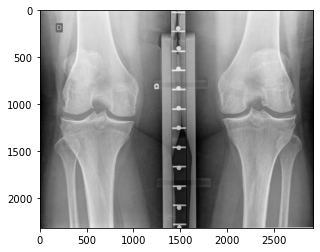

In [39]:
im = pydicom.dcmread(mypath+'IM-1333-0001.dcm')
arr = im.pixel_array

plt.imshow(arr, cmap="gray")
plt.show()

IM-9382-0001.dcm


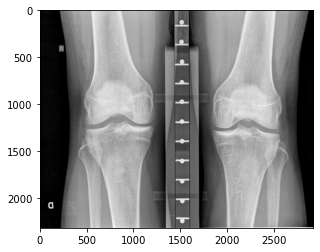

IM-8805-0001-0001.dcm


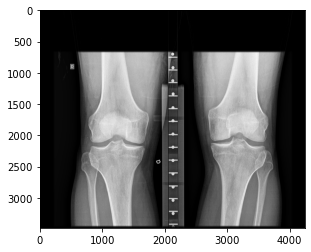

IM-6419-0001.dcm


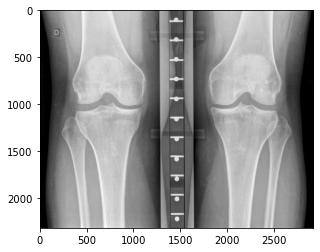

IM-0398-0001.dcm


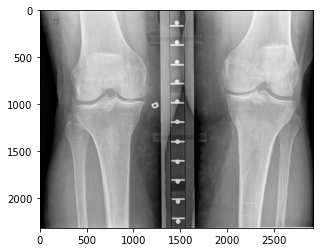

IM-7799-0001.dcm


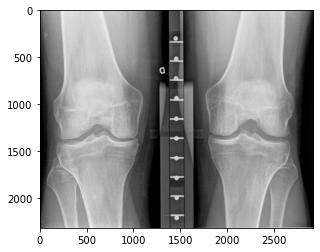

IM-1739-0001-0002.dcm


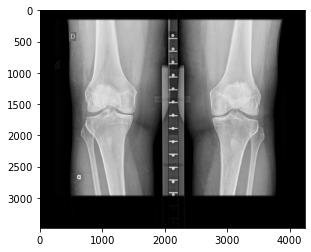

IM-4230-0001.dcm


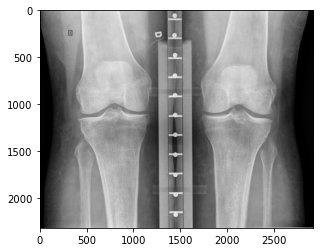

IM-3850-0001.dcm


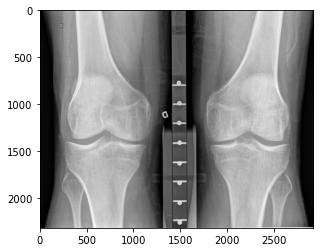

IM-5039-0001.dcm


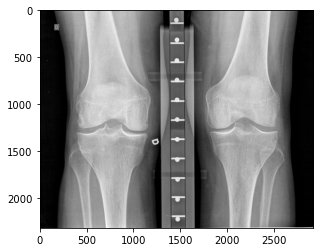

IM-4465-0001.dcm


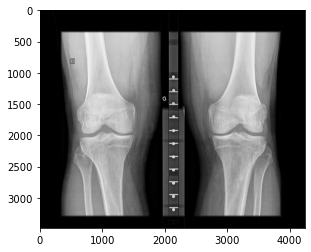

IM-7709-0001.dcm


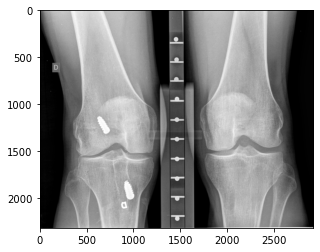

IM-4873-0001.dcm


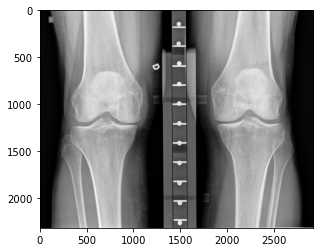

IM-3429-0001.dcm


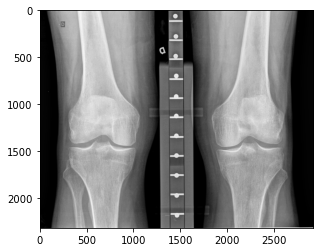

IM-13776-0001.dcm


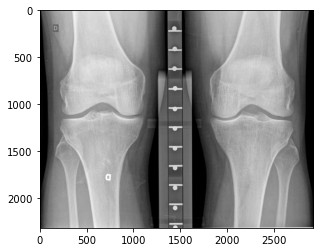

IM-4347-0001.dcm


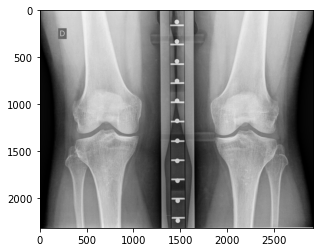

IM-5489-0001.dcm


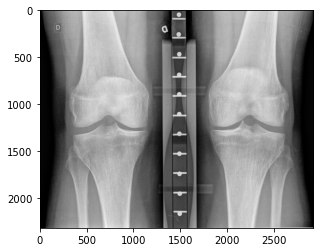

IM-8981-0001.dcm


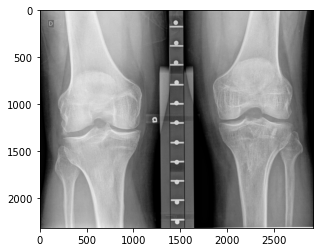

IM-6952-0001.dcm


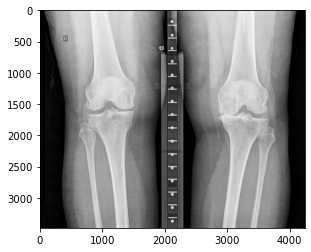

IM-6609-0001.dcm


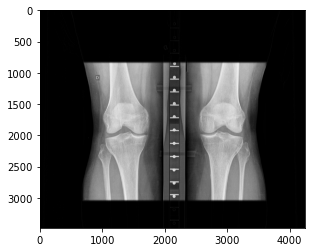

IM-11966-0001.dcm


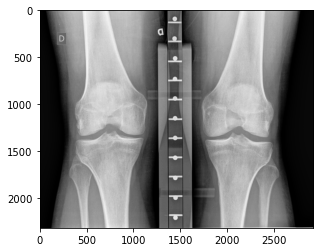

IM-0531-0001.dcm


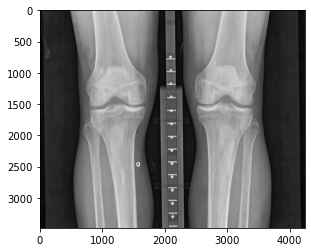

IM-6028-0001.dcm


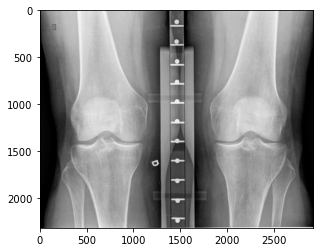

IM-2291-0001.dcm


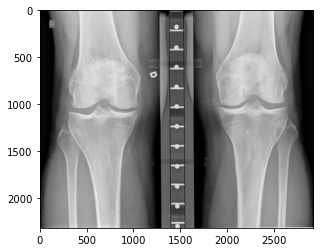

IM-2627-0001.dcm


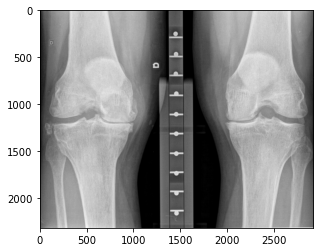

IM-8556-0001.dcm


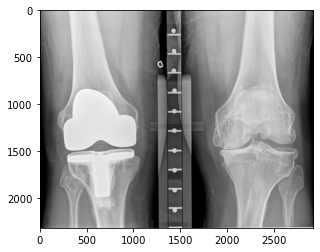

IM-5870-0001-0001.dcm


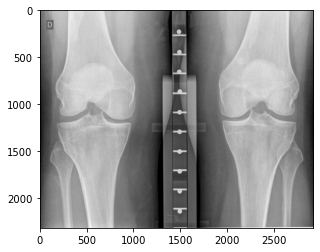

IM-1180-0001.dcm


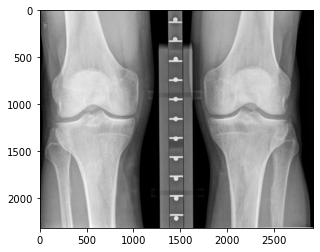

IM-4981-0001.dcm


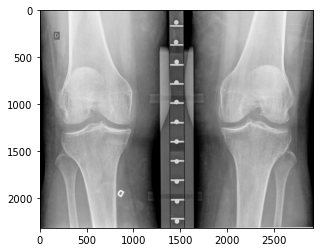

IM-4027-0001.dcm


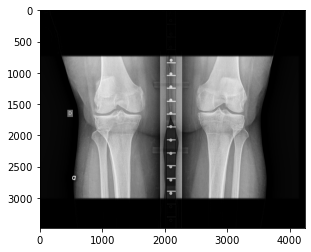

IM-10568-0001.dcm


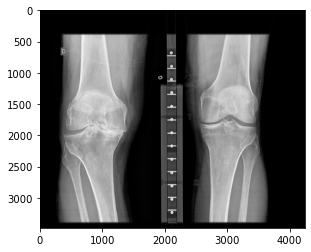

IM-13087-0001.dcm


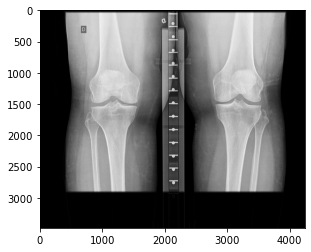

IM-10586-0001.dcm


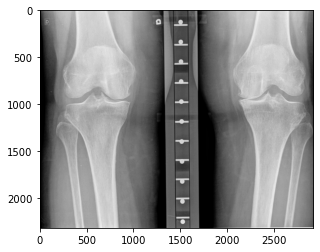

IM-4706-0001.dcm


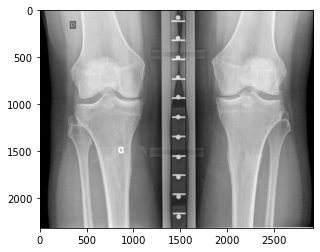

IM-6446-0001.dcm


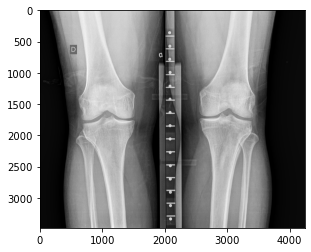

IM-2158-0001.dcm


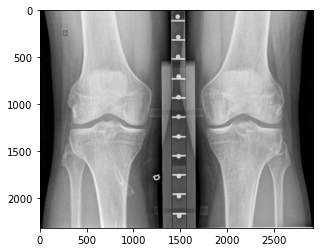

IM-1030-0001.dcm


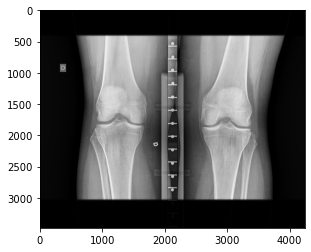

IM-8805-0001-0002.dcm


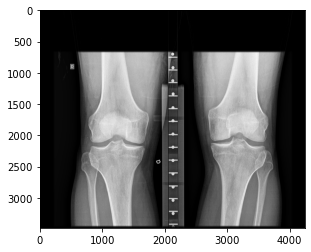

IM-1133-0001.dcm


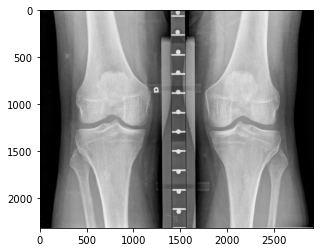

IM-8620-0001.dcm


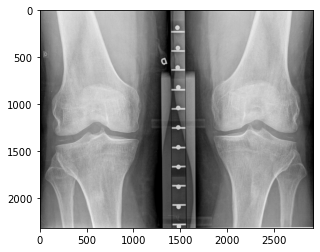

IM-3865-0001.dcm


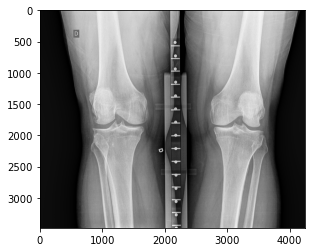

IM-13913-0001.dcm


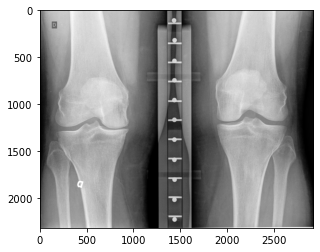

IM-4159-0001.dcm


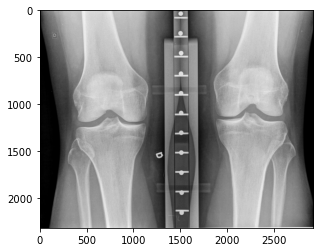

IM-5001-0001.dcm


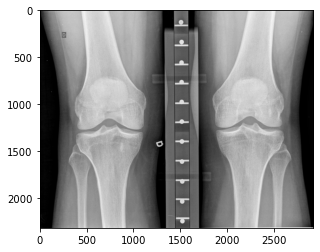

IM-9812-0001.dcm


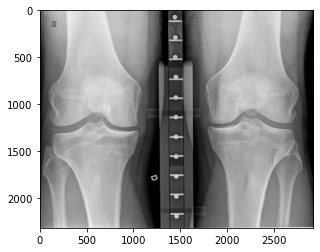

IM-5526-0001.dcm


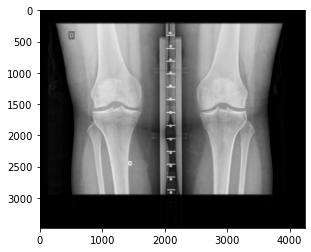

IM-1739-0001-0001.dcm


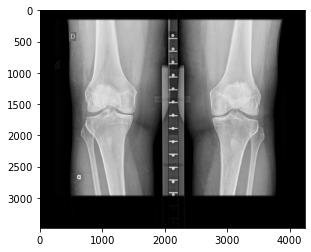

IM-4993-0001.dcm


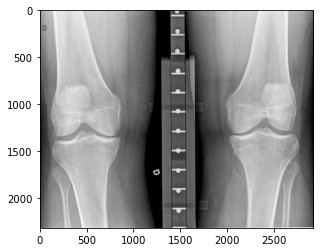

IM-13310-0001.dcm


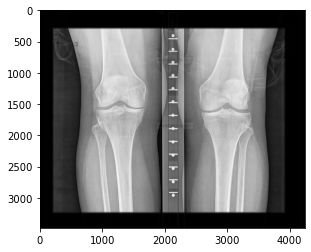

IM-5636-0001.dcm


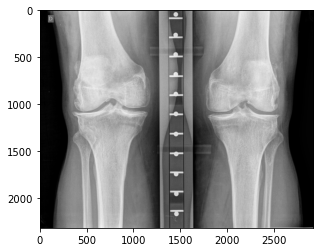

IM-0486-0001.dcm


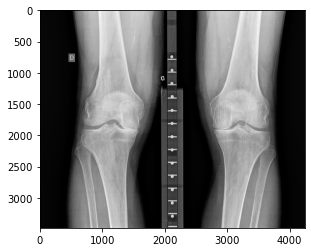

IM-8021-0001.dcm


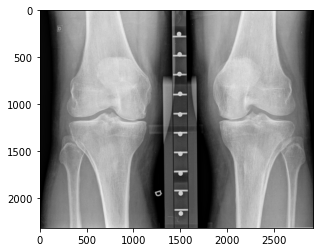

IM-6644-0001.dcm


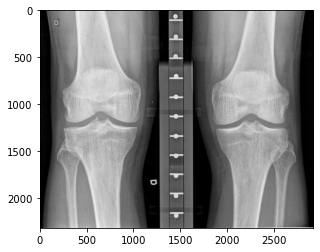

IM-8885-0001.dcm


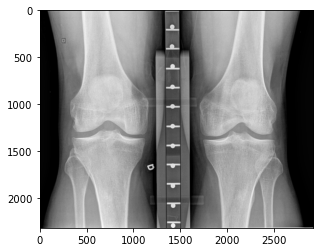

IM-10136-0001.dcm


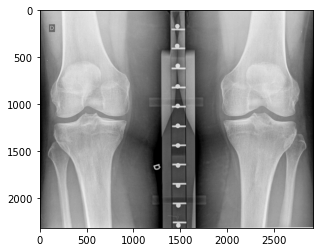

IM-7870-0001.dcm


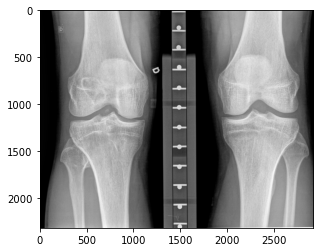

IM-10239-0001.dcm


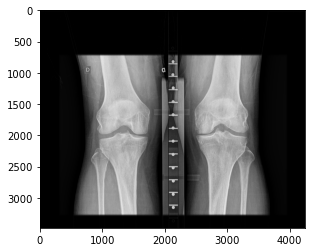

IM-10998-0001.dcm


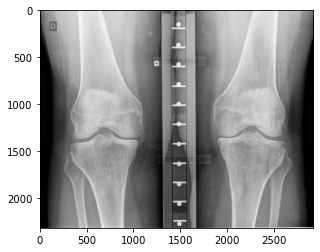

IM-6714-0001.dcm


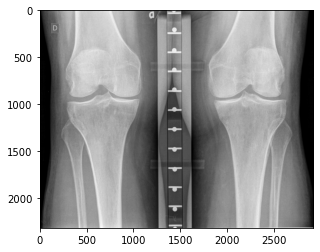

IM-0170-0001.dcm


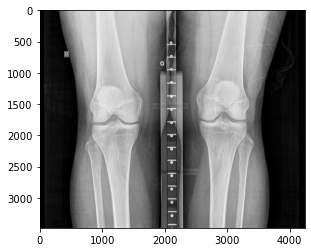

IM-8513-0001.dcm


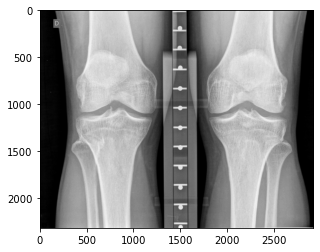

IM-6105-0001.dcm


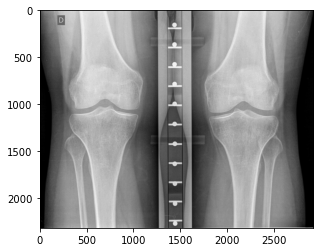

IM-12502-0001.dcm


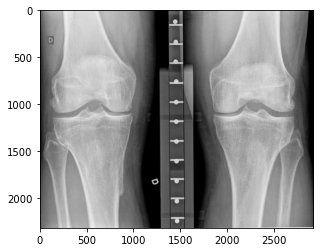

IM-13150-0001.dcm


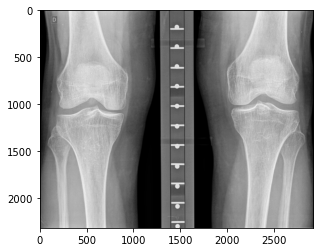

IM-2456-0001.dcm


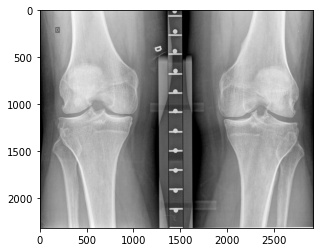

IM-1333-0001.dcm


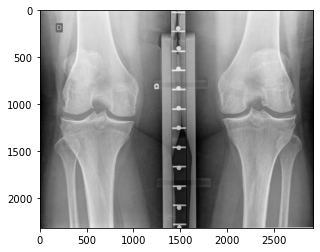

IM-13773-0001.dcm


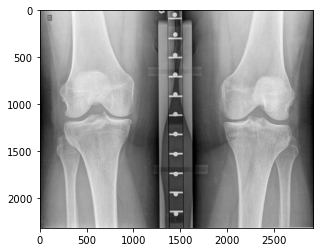

IM-5311-0001.dcm


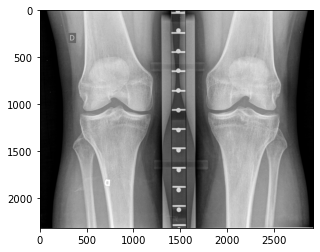

IM-12488-0001.dcm


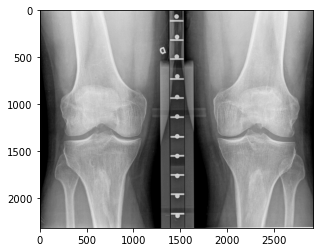

IM-13828-0001.dcm


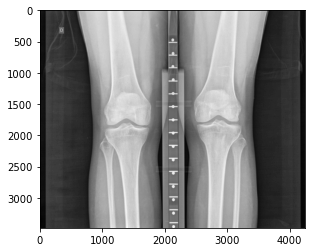

IM-3945-0001.dcm


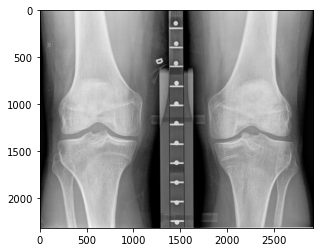

IM-12768-0001.dcm


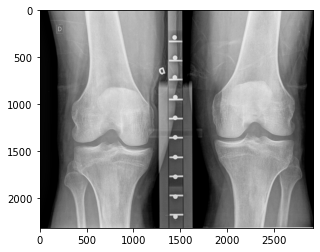

IM-13504-0001.dcm


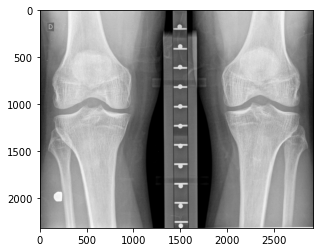

IM-9777-0001.dcm


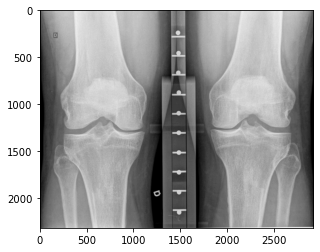

IM-11900-0001.dcm


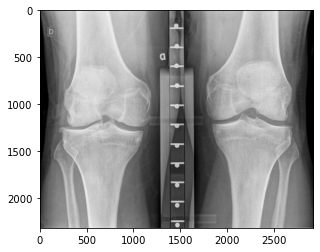

IM-0818-0001.dcm


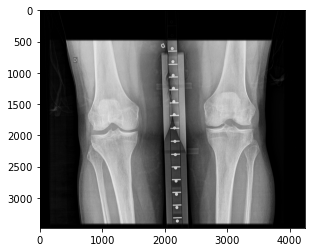

IM-7539-0001.dcm


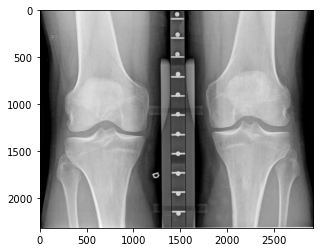

IM-14068-0001.dcm


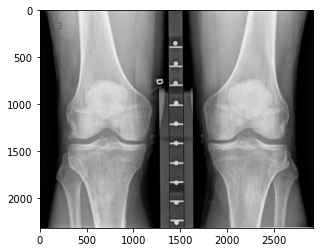

IM-5870-0001-0002.dcm


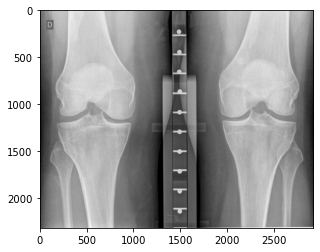

IM-10575-0001.dcm


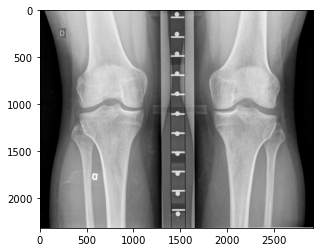

IM-10715-0001.dcm


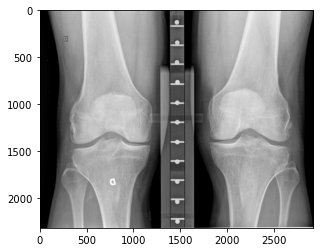

IM-14343-0001.dcm


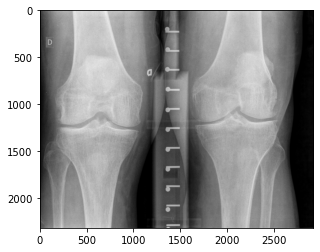

IM-13920-0001.dcm


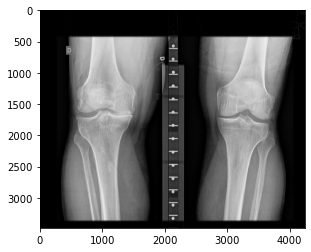

IM-4821-0001.dcm


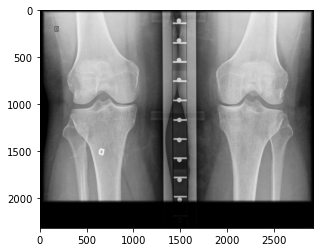

IM-7194-0001.dcm


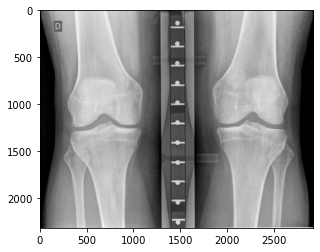

IM-10621-0001.dcm


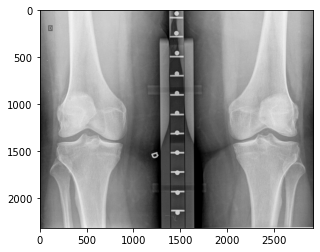

IM-14211-0001.dcm


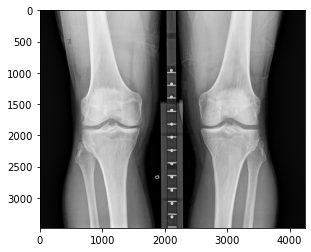

IM-11440-0001.dcm


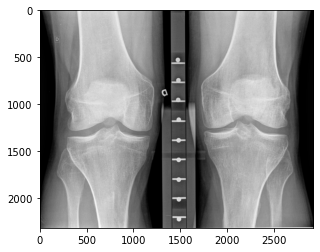

IM-10118-0001.dcm


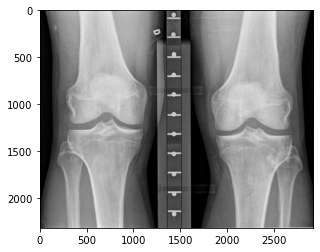

IM-13783-0001.dcm


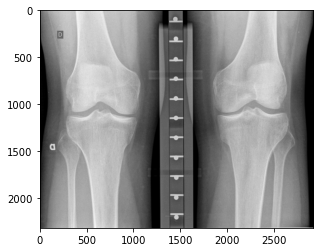

IM-10581-0001.dcm


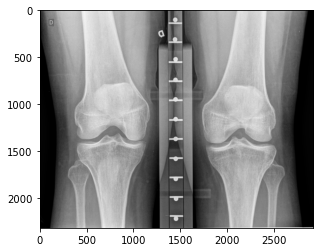

IM-6579-0001.dcm


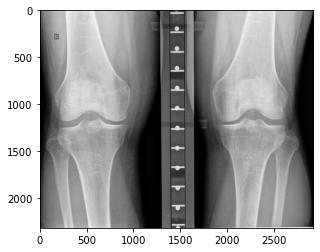

IM-9072-0001.dcm


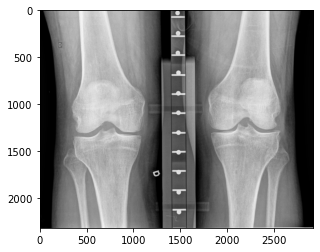

IM-0258-0001.dcm


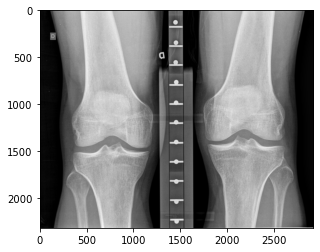

IM-8966-0001.dcm


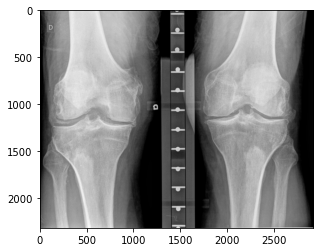

IM-13778-0001.dcm


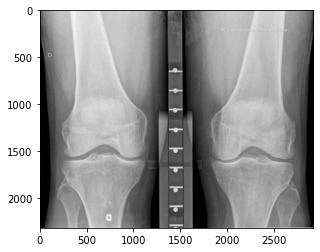

IM-2793-0001.dcm


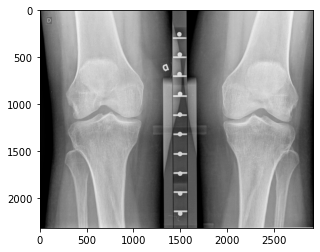

IM-9999-0001.dcm


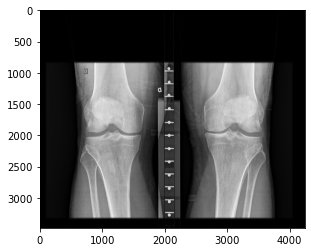

IM-1517-0001.dcm


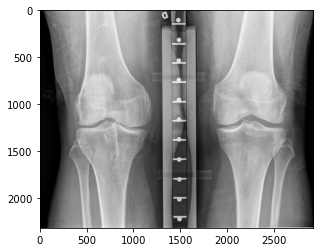

IM-0528-0001.dcm


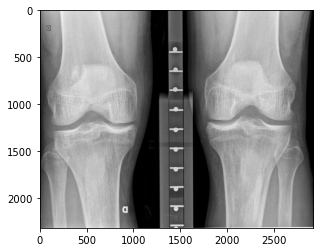

IM-0108-0001.dcm


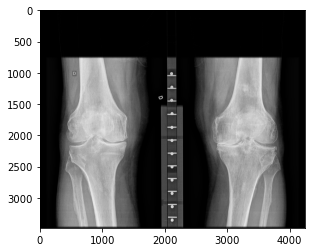

IM-7666-0001.dcm


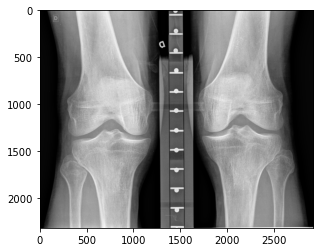

IM-13335-0001.dcm


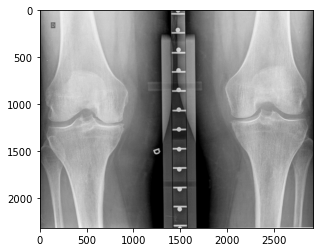

IM-3614-0001.dcm


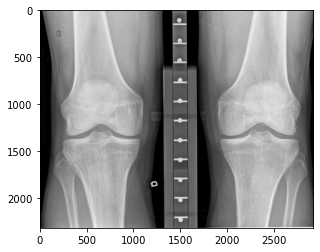

IM-5159-0001.dcm


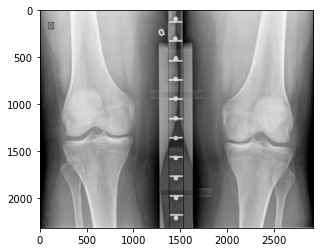

IM-5167-0001.dcm


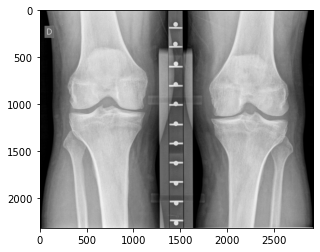

IM-7609-0001.dcm


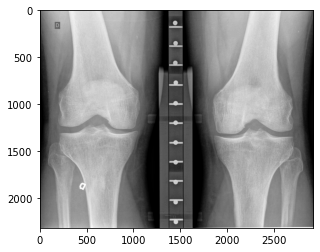

IM-13756-0001.dcm


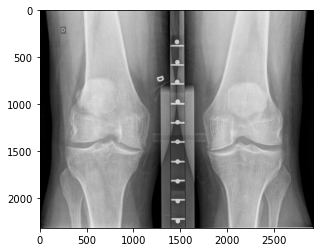

IM-5845-0001.dcm


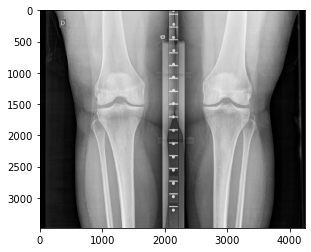

IM-9951-0001.dcm


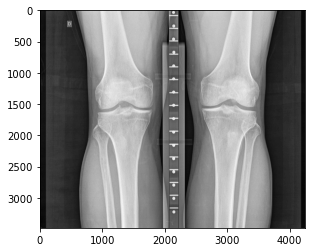

IM-5446-0001.dcm


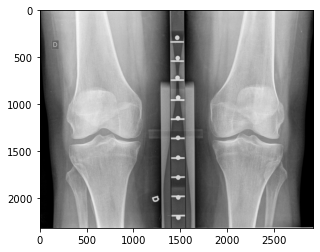

IM-5815-0001.dcm


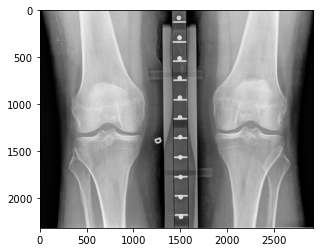

IM-5889-0001.dcm


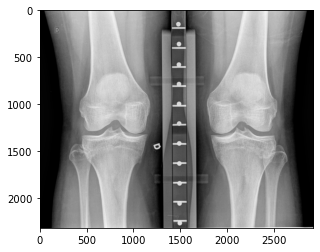

IM-12563-0001.dcm


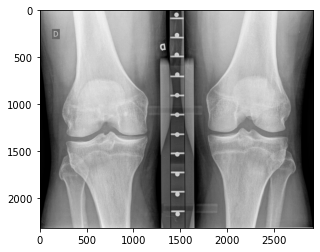

IM-6015-0001.dcm


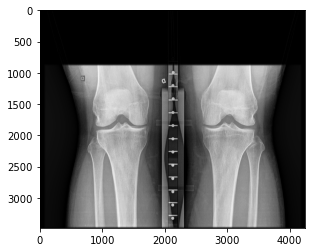

IM-13777-0001.dcm


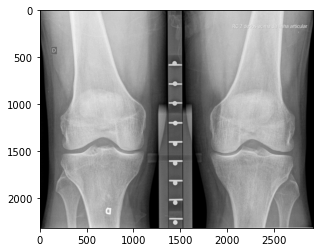

IM-13780-0001.dcm


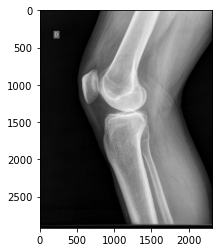

IM-7433-0001.dcm


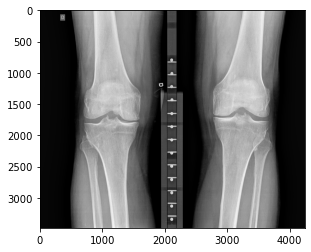

IM-8421-0001.dcm


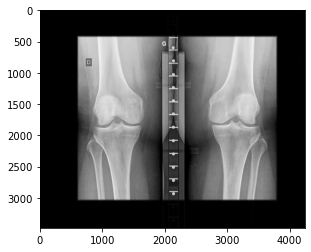

IM-5416-0001.dcm


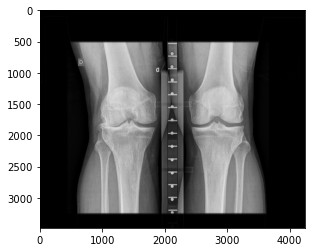

IM-8426-0001.dcm


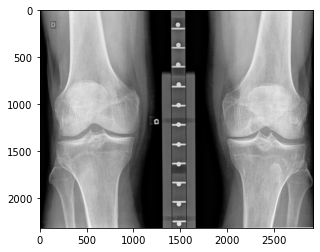

IM-7132-0001-0002.dcm


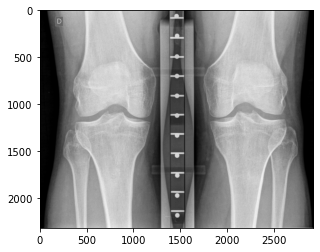

IM-10386-0001.dcm


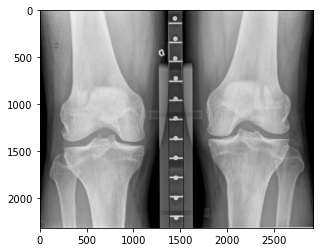

IM-0325-0001.dcm


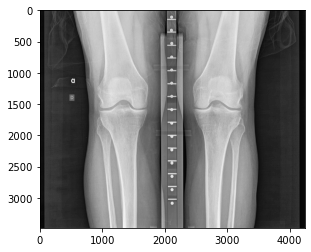

IM-4621-0001.dcm


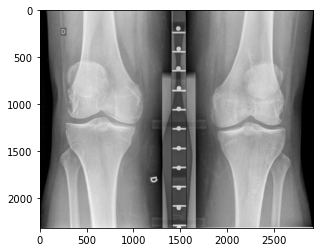

IM-11372-0001.dcm


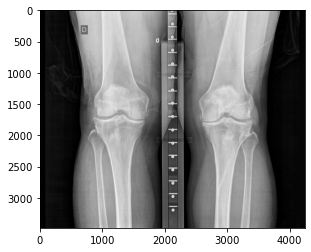

IM-5788-0001.dcm


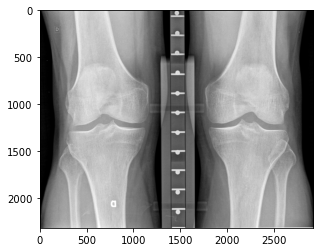

IM-0005-0001.dcm


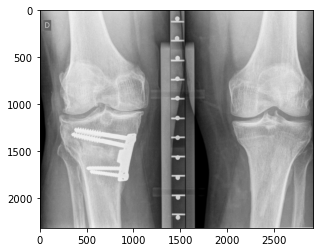

IM-11683-0001.dcm


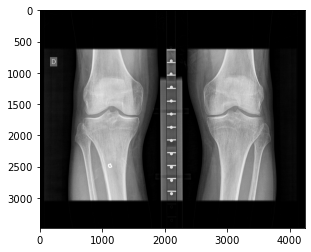

IM-12329-0001.dcm


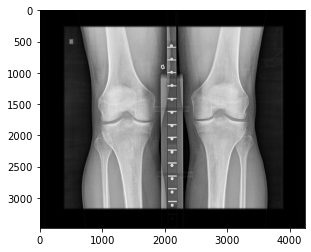

IM-9680-0001.dcm


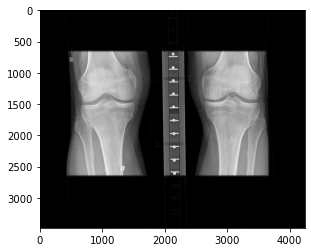

IM-14016-0001.dcm


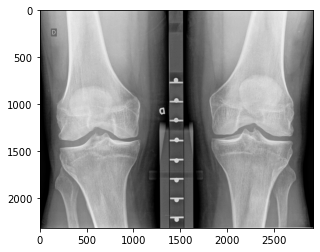

IM-6681-0001.dcm


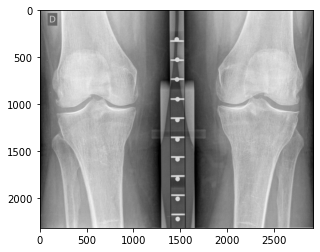

IM-11626-0001.dcm


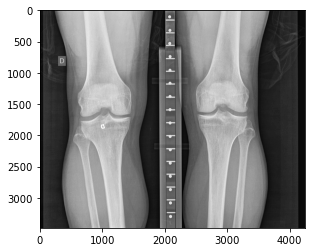

IM-1411-0001.dcm


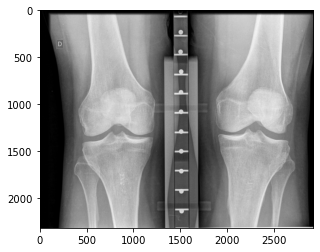

IM-9201-0001.dcm


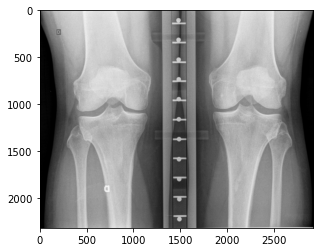

IM-9026-0001.dcm


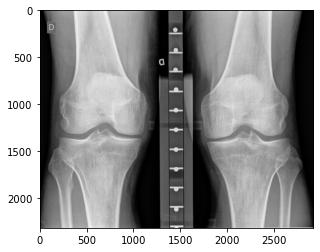

IM-4153-0001.dcm


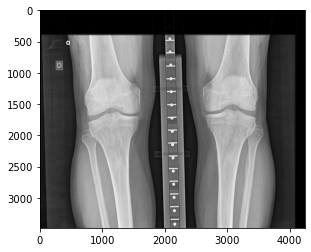

IM-5335-0001.dcm


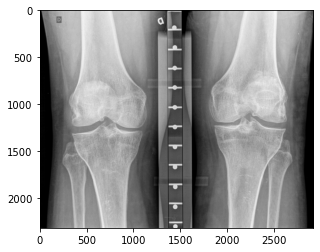

IM-1398-0001.dcm


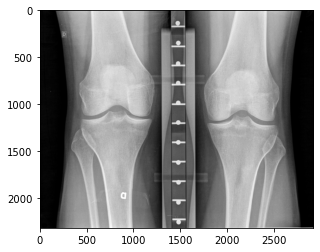

IM-9908-0001.dcm


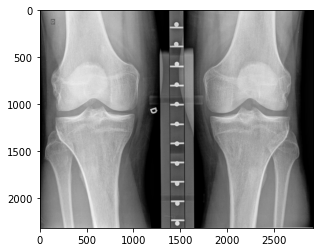

IM-13240-0001.dcm


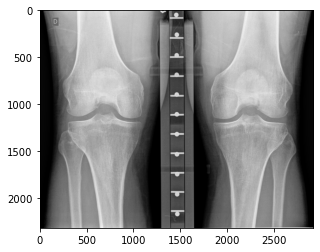

IM-6474-0001.dcm


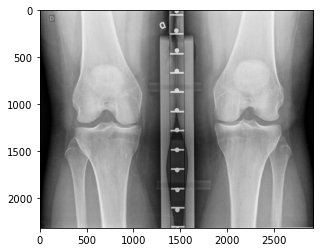

IM-1340-0001.dcm


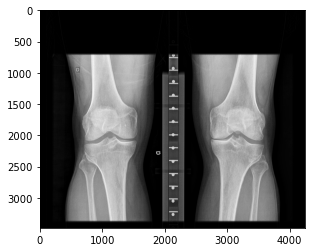

IM-6464-0001.dcm


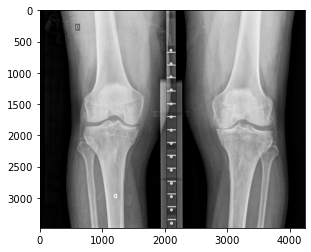

IM-5644-0001.dcm


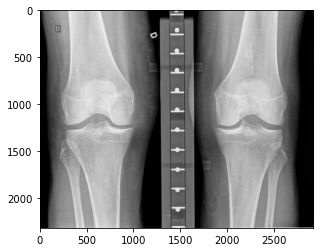

IM-1128-0001.dcm


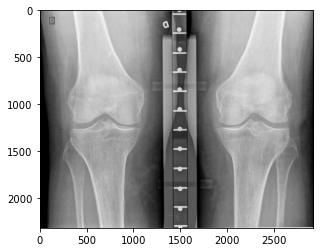

IM-1493-0001.dcm


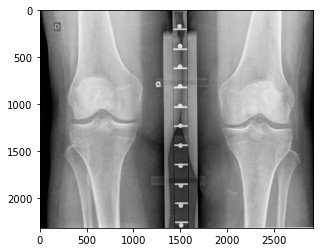

IM-7421-0001.dcm


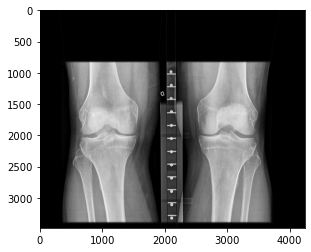

IM-3392-0001.dcm


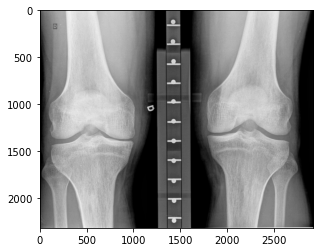

IM-5174-0001.dcm


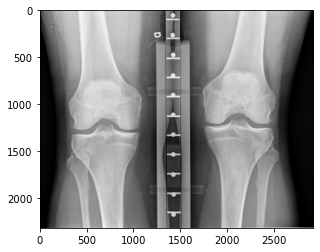

IM-5927-0001.dcm


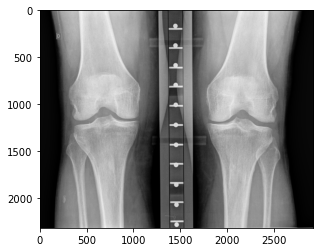

IM-5559-0001.dcm


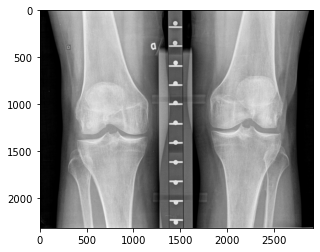

IM-4456-0001.dcm


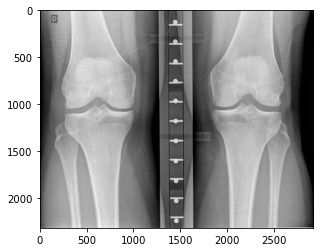

IM-4141-0001.dcm


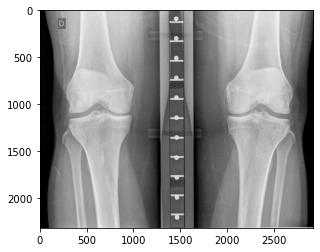

IM-12978-0001.dcm


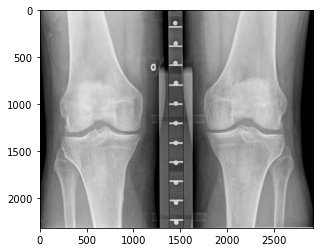

IM-7756-0001.dcm


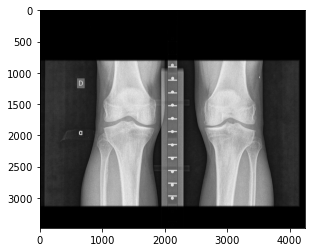

IM-2058-0001.dcm


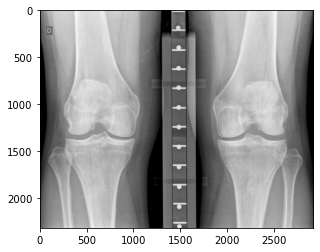

IM-9992-0001.dcm


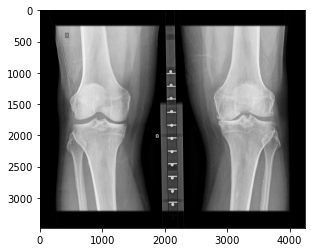

IM-10633-0001-0002.dcm


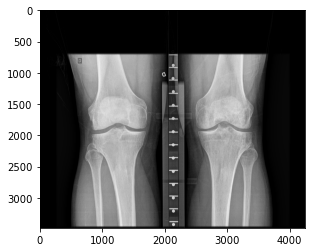

IM-11360-0001.dcm


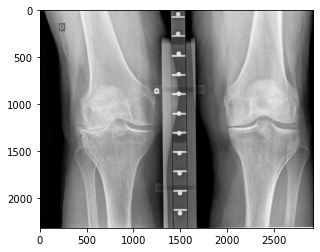

IM-10633-0001-0001.dcm


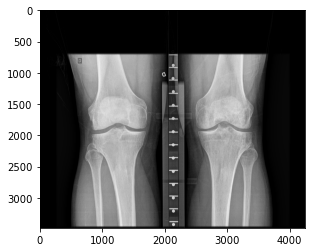

IM-0724-0001.dcm


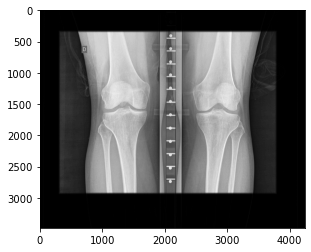

IM-4020-0001.dcm


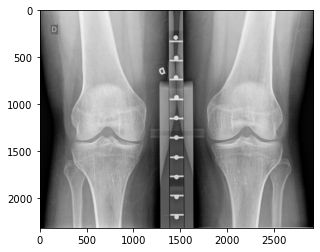

IM-9077-0001.dcm


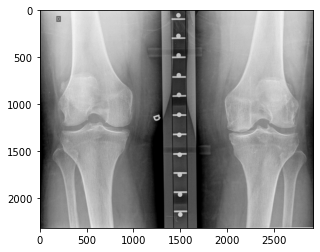

IM-12091-0001.dcm


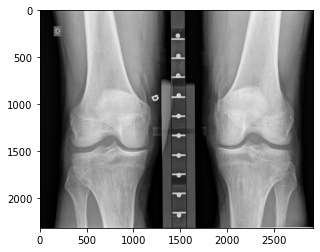

IM-9466-0001.dcm


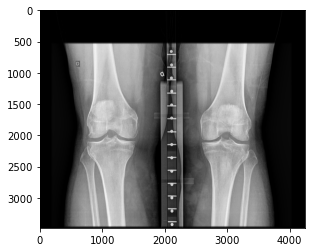

IM-3845-0001.dcm


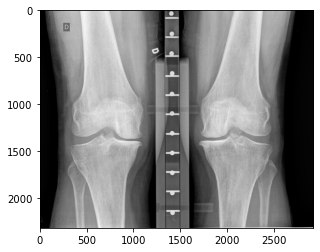

IM-4858-0001.dcm


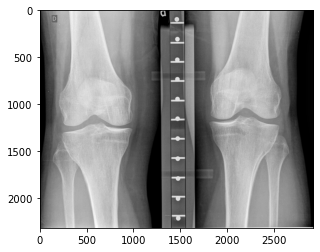

IM-6416-0001.dcm


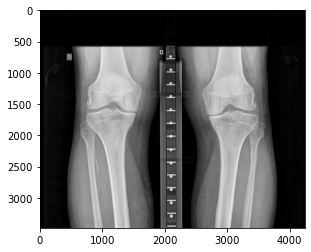

IM-4354-0001.dcm


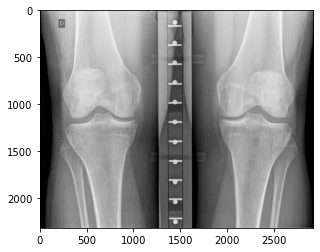

IM-6399-0001.dcm


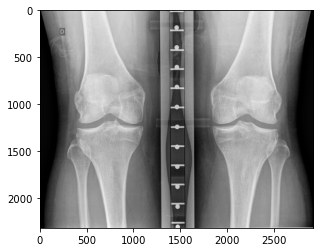

IM-3069-0001.dcm


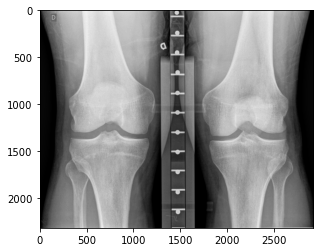

IM-2543-0001.dcm


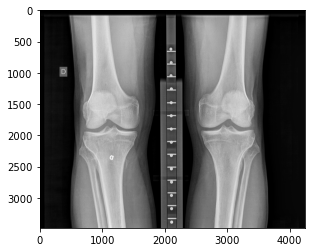

IM-10108-0001.dcm


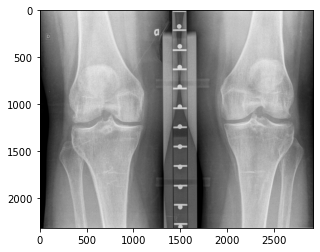

IM-7132-0001-0001.dcm


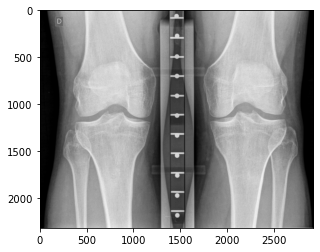

IM-7524-0001.dcm


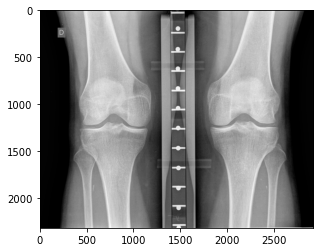

IM-12618-0001.dcm


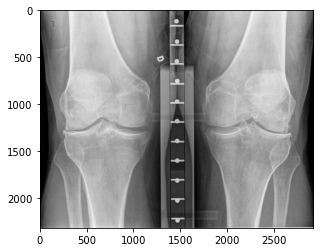

IM-4516-0001.dcm


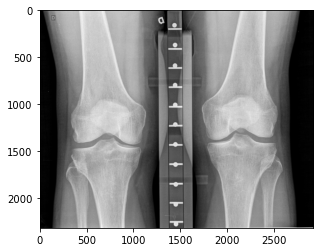

IM-13529-0001.dcm


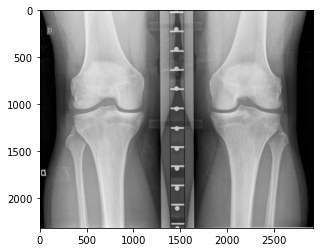

IM-8537-0001.dcm


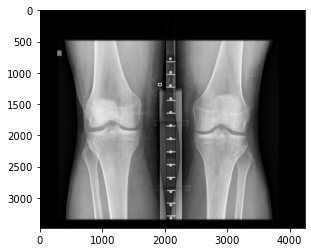

IM-4591-0001.dcm


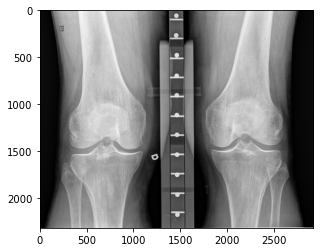

IM-0711-0001.dcm


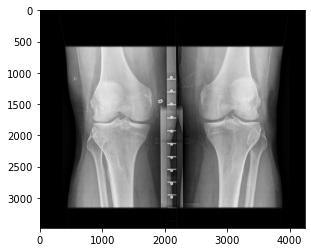

IM-2591-0001.dcm


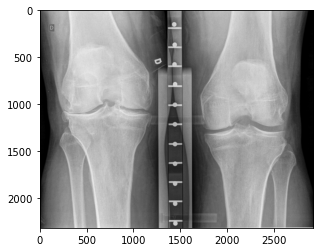

IM-6915-0001.dcm


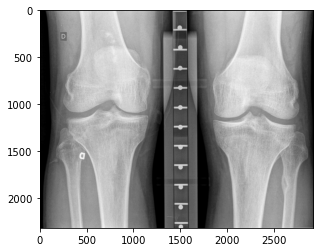

In [23]:
# `arr` is a numpy.ndarray
for img in joelhos:
    print(img)
    im = pydicom.dcmread(mypath+img)
    arr = im.pixel_array

    plt.imshow(arr, cmap="gray")
    plt.show()

In [40]:
#para ler todas as imagens da pasta
pixel_data = []
paths = glob.glob("kneedata/IM*.dcm")
for path in paths:
    dataset = pydicom.dcmread(path)
    pixel_data.append(dataset.pixel_array)

In [15]:
pixel_data

[array([[50, 50, 47, ...,  4,  3,  3],
        [52, 52, 49, ...,  2,  2,  4],
        [56, 52, 51, ...,  2,  3,  2],
        ...,
        [69, 61, 67, ..., 26, 25, 27],
        [63, 61, 65, ..., 31, 30, 30],
        [63, 67, 64, ..., 31, 29, 32]], dtype=uint8),
 array([[ 66,  59,  63, ...,  16,  18,  15],
        [ 56,  56,  54, ...,  18,  16,  19],
        [ 60,  50,  55, ...,  15,  14,  14],
        ...,
        [  1,   1,   2, ..., 179, 177, 184],
        [  1,   2,   2, ..., 186, 187, 191],
        [  2,   2,   1, ..., 195, 196, 195]], dtype=uint8),
 array([[141, 144, 154, ...,  25,  22,  25],
        [147, 149, 147, ...,  23,  20,  24],
        [146, 149, 146, ...,  19,  21,  23],
        ...,
        [  2,   2,   1, ...,   3,   3,   2],
        [  2,   3,   2, ...,   2,   3,   2],
        [  1,   3,   2, ...,   4,   4,   3]], dtype=uint8),
 array([[ 77,  85,  81, ...,  19,  17,  15],
        [ 82,  84,  84, ...,  18,  17,  15],
        [ 83,  81,  80, ...,  17,  15,  14],
       

In [ ]:
pixel_data

## Pegar tamanho de cada classe 

In [43]:
mypath = 'padrao_ouro_pr/0'
files = [f for f in listdir(mypath)]
len(files)

228

In [45]:
import pickle

In [53]:
with open("esquerdo_0", "wb") as fp:   #Pickling
    pickle.dump(esquerdo_0, fp)

with open("esquerdo_1", "wb") as fp:   #Pickling
    pickle.dump(esquerdo_1, fp)

with open("direito_0", "wb") as fp:   #Pickling
    pickle.dump(direito_0, fp)
    
with open("direito_1", "wb") as fp:   #Pickling
    pickle.dump(direito_1, fp)